In [1]:
# @title
!pip install ultralytics torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 68.1 MB/s eta 0:00:00


前置設定

In [12]:
from google.colab.patches import cv2_imshow
import cv2
import os
import sys
from ultralytics import YOLO

# 載入 YOLO 模型
yolo_model = YOLO("yolov8n.pt")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 載入 MiDaS 模型
midas = torch.hub.load("intel-isl/MiDaS", "DPT_Large").to(device)
midas.eval()

# 載入轉換工具
transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
transform = transforms.dpt_transform

try:
    # 如果 google.colab.patches.cv2_imshow 可用，直接使用（已由 import 提供）
    show_img = cv2_imshow
except Exception:
    def show_img(img, winname='img'):
        if img.dtype != np.uint8:
            disp = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        else:
            disp = img
        cv2.imshow(winname, disp)
        cv2.waitKey(1)

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


可行走區functions

In [13]:
import numpy as np
import cv2
from scipy.signal import convolve2d
from sklearn.cluster import KMeans
import torch
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation
from PIL import Image

# ============================================================
# 共用：Mask 疊在原圖上
# ============================================================
def overlay_mask(mask, img, color=(0,255,0), alpha=0.45):
    mask = mask.astype(bool)
    layer = np.zeros_like(img)
    layer[mask] = color
    return cv2.addWeighted(layer, alpha, img, 1-alpha, 0)


# ============================================================
# STEP 1：計算 Normal
# ============================================================
def compute_normals_from_depth(depth_smooth):
    dzdx = np.gradient(depth_smooth, axis=1)
    dzdy = np.gradient(depth_smooth, axis=0)
    nx = -dzdx
    ny = -dzdy
    nz = np.ones_like(depth_smooth)

    norm = np.sqrt(nx*nx + ny*ny + nz*nz) + 1e-6
    return nx/norm, ny/norm, nz/norm


# ============================================================
# STEP 2：樓梯偵測（你原本 v1）
# ============================================================
def stair_detect_v1(ny):
    """
    ny : (H, W) normal-y map
    return dict:
      {
        "has_stair": bool,
        "score": float,
        "stair_mask": bool(H,W),
        "vis": None
      }
    """

    import numpy as np
    import cv2
    from scipy.signal import convolve2d

    H, W = ny.shape

    # 1) vertical gradient
    g_ny = np.abs(np.gradient(ny, axis=0))
    g_ny_norm = g_ny / (g_ny.max() + 1e-6)
    stair_edge = (g_ny_norm > 0.25).astype(np.uint8)

    # 2) stair horizontal pattern
    stair_kernel = np.array([
        [-1,-1,-1],
        [ 2, 2, 2],
        [-1,-1,-1],
    ], dtype=np.float32)

    pattern = convolve2d(ny, stair_kernel, mode="same", boundary="symm")
    pattern_norm = np.abs(pattern) / (pattern.max() + 1e-6)
    stair_pattern = (pattern_norm > 0.35).astype(np.uint8)

    # 3) intersection
    stair_mask_raw = stair_edge & stair_pattern

    # 4) morphology
    stair_mask = cv2.morphologyEx(stair_mask_raw, cv2.MORPH_CLOSE, np.ones((7,7),np.uint8))
    stair_mask = cv2.morphologyEx(stair_mask, cv2.MORPH_OPEN, np.ones((5,5),np.uint8))
    stair_mask = stair_mask.astype(bool)

    # 5) score
    score = float(stair_mask.mean())
    has_stair = score > 0.01

    # Return dict
    return {
        "has_stair": has_stair,
        "score": score,
        "stair_mask": stair_mask,
        "vis": None,
    }


def stair_detect_v2(ny, pred_ade, ade_thr=0.01, normal_thr=0.005):

    # --- normal-based ---
    res = stair_detect_v1(ny)
    score_normal = res["score"]

    # --- ADE semantic-based ---
    score_ade = ade_stair_ratio(pred_ade)

    has_stair = (score_normal > normal_thr) or (score_ade > ade_thr)

    return {
        "has_stair": has_stair,
        "normal_score": score_normal,
        "ade_score": score_ade,
        "stair_mask": res["stair_mask"],   # still return normal mask
    }



# ============================================================
# STEP 3：KMeans + Normal 抓樓梯踏面
# ============================================================
def extract_walkable_from_normal_autoK_middle(original_bgr, ny,
                                              open_k=3, close_k=5):

    # normalize ny
    ny_norm = (ny - ny.min()) / (ny.max() - ny.min() + 1e-6)
    ny_flat = ny_norm.reshape(-1, 1)

    # --- KMeans clustering (3 groups) ---
    kmeans = KMeans(n_clusters=3, n_init=10).fit(ny_flat)
    labels = kmeans.labels_.reshape(ny_norm.shape)

    # cluster means
    cluster_means = np.array([ny_norm[labels == i].mean() for i in range(3)])

    # pick middle cluster
    walk_cluster = np.argsort(cluster_means)[1]

    walk_mask = (labels == walk_cluster)

    # morphology
    walk_mask_u8 = walk_mask.astype(np.uint8) * 255
    walk_mask_u8 = cv2.morphologyEx(
        walk_mask_u8, cv2.MORPH_OPEN, np.ones((open_k, open_k), np.uint8)
    )
    walk_mask_u8 = cv2.morphologyEx(
        walk_mask_u8, cv2.MORPH_CLOSE, np.ones((close_k, close_k), np.uint8)
    )

    # resize to full image size
    h, w = original_bgr.shape[:2]
    walk_big = cv2.resize(
        walk_mask_u8, (w, h), interpolation=cv2.INTER_NEAREST
    )

    # visualization → yellow highlight
    vis = original_bgr.copy()
    yellow = np.array([0, 255, 255], np.uint8)
    vis[walk_big > 0] = (
        vis[walk_big > 0] * 0.4 + yellow * 0.6
    ).astype(np.uint8)

    return walk_big.astype(bool), vis

# ============================================================
# STEP 4：ADE（室內） + Cityscapes（室外）
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ADE20K
MODEL_ADE = "nvidia/segformer-b0-finetuned-ade-512-512"
ade_extractor = SegformerFeatureExtractor.from_pretrained(MODEL_ADE)
ade_model = SegformerForSemanticSegmentation.from_pretrained(MODEL_ADE).to(device).eval()
ade_id2label = ade_model.config.id2label

ADE_WALKABLE = ["floor", "ground", "road", "sidewalk"]
ade_walk_ids = np.array([cid for cid,n in ade_id2label.items()
                         if any(w in n.lower() for w in ADE_WALKABLE)])

ADE_FLOOR_ONLY = np.array([cid for cid,n in ade_id2label.items()
                           if "floor" in n.lower()])


def run_ade(img_bgr):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    pil = Image.fromarray(img_rgb)
    inp = ade_extractor(images=pil, return_tensors="pt").to(device)
    with torch.no_grad():
        out = ade_model(**inp)
        logits = out.logits
        logits = torch.nn.functional.interpolate(
            logits, size=img_rgb.shape[:2], mode="bilinear", align_corners=False
        )
    pred = logits.argmax(1)[0].cpu().numpy()
    return pred


def build_ade_mask(pred):
    return np.isin(pred, ade_walk_ids)


def ade_floor_ratio(pred):
    if len(ADE_FLOOR_ONLY)==0: return 0
    return float(np.isin(pred, ADE_FLOOR_ONLY).mean())


# Cityscapes
MODEL_CITY = "nvidia/segformer-b2-finetuned-cityscapes-1024-1024"
city_ext = SegformerFeatureExtractor.from_pretrained(MODEL_CITY)
city_model = SegformerForSemanticSegmentation.from_pretrained(MODEL_CITY).to(device).eval()

CITY_FREE = {0,1,9}  # road sidewalk terrain

def run_city(img_bgr):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    pil = Image.fromarray(img_rgb)
    inp = city_ext(images=pil, return_tensors="pt").to(device)

    with torch.no_grad():
        out = city_model(**inp)
        logits = out.logits
        logits = torch.nn.functional.interpolate(
            logits, size=img_rgb.shape[:2], mode="bilinear", align_corners=False
        )
        pred = logits.argmax(1)[0].cpu().numpy()

    return np.isin(pred, list(CITY_FREE))


def ade_stair_ratio(pred_ade):
    """
    ADE20K 有 staircase / stairs 類別
    """
    stair_keywords = ["stair", "staircase"]
    stair_ids = [cid for cid,name in ade_id2label.items()
                 if any(k in name.lower() for k in stair_keywords)]
    if len(stair_ids)==0:
        return 0.0
    return float(np.isin(pred_ade, stair_ids).mean())



# ============================================================
# STEP 5：Hybrid FreeSpace v13  (Fixed version)
# ============================================================
def hybrid_freespace_v13(depth, original_bgr, floor_ratio_thr=0.02,
                         debug_print=True):
    """
    v13 (fixed):
    - Detect stair → ALWAYS use KMeans walkable (yellow)
    - No stair → use semantic freespace (ADE indoor / City outdoor)
    """

    h_img, w_img = original_bgr.shape[:2]

    # ---------- A. ADE segmentation for indoor/outdoor ----------
    pred_ade = run_ade(original_bgr)
    floor_ratio = ade_floor_ratio(pred_ade)

    scene_type = "indoor" if floor_ratio > floor_ratio_thr else "outdoor"
    if debug_print:
        print(f"[SceneType] {scene_type}, floor_ratio={floor_ratio:.4f}")

    # ---------- B. Semantic free-space ----------
    if scene_type == "indoor":
        semantic_mask = build_ade_mask(pred_ade)
    else:
        semantic_mask = run_city(original_bgr)

    # ---------- C. depth → normal → stair detect ----------
    depth = depth.astype(np.float32)
    depth_norm = (depth - depth.min()) / (depth.max() - depth.min() + 1e-6)
    depth_smooth = cv2.GaussianBlur(depth_norm, (5, 5), 0)
    nx, ny, nz = compute_normals_from_depth(depth_smooth)

    # stair_res = stair_detect_v1(ny)
    # has_stair = stair_res["has_stair"]

    stair_res = stair_detect_v2(ny, pred_ade)
    has_stair = stair_res["has_stair"]

    # ---------- D. If stair detected → FORCE USE KMeans ----------
    if has_stair:
        print(">>> Stair detected → using KMeans walkable (yellow) as FINAL output")

        walk_big, vis = extract_walkable_from_normal_autoK_middle(
            original_bgr, ny,
            open_k=3,
            close_k=5
        )

        final_mask = walk_big.astype(bool)
        final_overlay = vis

        # still show semantic for reference
        semantic_overlay = overlay_mask(semantic_mask, original_bgr,
                                        color=(0, 255, 0), alpha=0.45)

    else:
        print(">>> No stair → using semantic segmentation (green)")
        final_mask = semantic_mask
        final_overlay = overlay_mask(final_mask, original_bgr,
                                     color=(0, 255, 0), alpha=0.45)
        semantic_overlay = final_overlay.copy()

    # ---------- E. Normal overlay ----------
    ny_norm = (ny - ny.min()) / (ny.max() - ny.min() + 1e-6)
    ny_vis = (ny_norm * 255).astype(np.uint8)
    ny_color = cv2.applyColorMap(ny_vis, cv2.COLORMAP_JET)
    ny_color_big = cv2.resize(ny_color, (w_img, h_img))
    normal_overlay = cv2.addWeighted(original_bgr, 0.5, ny_color_big, 0.5, 0)

    return {
        "final_mask_img": final_mask,
        "semantic_mask": semantic_mask,
        "final_overlay": final_overlay,     # ★ key output
        "semantic_overlay": semantic_overlay,
        "normal_overlay": normal_overlay,
        "has_stair": has_stair,
        "scene_type": scene_type,
    }



障礙物判斷functions

In [5]:
def preprocess_depth(depth):
    """MiDaS depth 2D array -> 填洞、去雜訊、回傳 float32 depth"""
    d = depth.astype(np.float32).copy()
    invalid = ~np.isfinite(d) | (d <= 0)
    if invalid.all():
        return d
    med = np.nanmedian(d[~invalid])
    d[np.isnan(d)] = med
    d[np.isinf(d)] = med
    d[d <= 0] = med

    minv, maxv = float(np.min(d)), float(np.max(d))
    if maxv - minv < 1e-6:
        return d.astype(np.float32)

    # scale to 0-255 uint8 for inpaint (cv2.inpaint 以 8bit 最穩定)
    scaled = ((d - minv) / (maxv - minv) * 255.0).astype(np.uint8)
    mask = (invalid.astype('uint8') * 255)
    try:
        inpainted = cv2.inpaint(scaled, mask, 5, cv2.INPAINT_NS)
    except Exception:
        # fallback: 用中位數填補缺失區域
        inpainted = scaled.copy()
        if np.any(mask == 0):
            fallback_val = int(np.median(scaled[mask == 0]))
        else:
            fallback_val = 0
        inpainted[mask == 255] = fallback_val

    restored = inpainted.astype(np.float32) / 255.0 * (maxv - minv) + minv
    out = cv2.GaussianBlur(restored, (5,5), 0)
    return out

def detect_vertical_obstacles_by_depth_grad(depth, sobel_ksize=5, mag_thresh_scale=1.5):
    """用 depth gradient 找垂直深度跳變（牆/邊緣）。"""
    g_x = cv2.Sobel(depth, cv2.CV_32F, 1, 0, ksize=sobel_ksize)
    g_y = cv2.Sobel(depth, cv2.CV_32F, 0, 1, ksize=sobel_ksize)
    mag = np.sqrt(g_x**2 + g_y**2)
    med = np.nanmedian(mag[np.isfinite(mag)]) if np.isfinite(mag).any() else 0.0
    th = med * mag_thresh_scale + 1e-6
    mask = (mag > th).astype(np.uint8) * 255
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.medianBlur(mask, 5)
    return mask

def detect_vertical_surfaces(depth):
    """用法向量近似判斷垂直表面（牆）。"""
    dzdx = cv2.Sobel(depth, cv2.CV_32F, 1, 0, ksize=5)
    dzdy = cv2.Sobel(depth, cv2.CV_32F, 0, 1, ksize=5)
    nx = dzdx
    ny = dzdy
    nz = np.ones_like(depth) * -1.0
    norm = np.sqrt(nx*nx + ny*ny + nz*nz) + 1e-6
    nx /= norm; ny /= norm; nz /= norm
    vertical_score = np.sqrt(nx*nx + ny*ny)
    vertical_mask = (vertical_score > 0.55).astype(np.uint8) * 255
    vertical_mask = cv2.morphologyEx(vertical_mask, cv2.MORPH_OPEN,
                                     cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))
    return vertical_mask

def ransac_plane_from_depth(depth, K=None, n_iters=1000, dist_thresh=0.02, sample_rate=0.02, ground_thresh=0.5):
    """若有相機內參 K，使用 3D RANSAC fitting 平面（可判別牆或地）。
       自動排除地板候選點，避免 RANSAC 抓到地板。
       ground_thresh: 排除地板的 normal y 分量門檻，越大排除範圍越廣
    """
    if K is None:
        return None, None, None

    H, W = depth.shape

    # ---------------------------
    # 用 depth gradient 初步估 normal
    dzdx = cv2.Sobel(depth, cv2.CV_32F, 1, 0, 5)
    dzdy = cv2.Sobel(depth, cv2.CV_32F, 0, 1, 5)
    nx = dzdx
    ny = dzdy
    nz = -1 * np.ones_like(depth)
    norm = np.sqrt(nx*nx + ny*ny + nz*nz) + 1e-6
    nx /= norm; ny /= norm; nz /= norm

    # 2️⃣ 排除 normal 近似地板的像素
    mask_not_ground = np.abs(ny) < ground_thresh  # y 分量太大 → 是地板
    ys, xs = np.where(mask_not_ground & np.isfinite(depth) & (depth > 0))
    if len(xs) < 50:
        return None, None, None

    zs = depth[ys, xs]
    pts_idx = np.arange(len(xs))
    sample_n = max(300, int(len(xs) * sample_rate))
    K_inv = np.linalg.inv(K)
    sel = np.random.choice(pts_idx, size=min(sample_n, len(pts_idx)), replace=False)

    coords = []
    for x, y, z in zip(xs[sel], ys[sel], zs[sel]):
        uv1 = np.array([x, y, 1.0])
        xyz = (K_inv @ uv1) * z
        coords.append(xyz)
    coords = np.array(coords)

    # ---------------------------
    # RANSAC 主迴圈
    best_n = None; best_d = None; best_cnt = 0; best_inliers = None
    for it in range(n_iters):
        ids = np.random.choice(coords.shape[0], 3, replace=False)
        p1, p2, p3 = coords[ids]
        v1 = p2 - p1
        v2 = p3 - p1
        n = np.cross(v1, v2)
        norm_val = np.linalg.norm(n)
        if norm_val < 1e-6:
            continue
        n = n / norm_val
        d = -np.dot(n, p1)
        dist = np.abs((coords @ n) + d)
        inl = dist < dist_thresh
        cnt = int(inl.sum())
        if cnt > best_cnt:
            best_cnt = cnt
            best_n = n.copy()
            best_d = d
            best_inliers = inl.copy()

    if best_n is None:
        return None, None, None

    # ---------------------------
    # 計算整張影像的 inliers mask
    all_coords = []
    for x, y in zip(xs, ys):
        z = depth[y, x]
        uv1 = np.array([x, y, 1.0])
        xyz = (K_inv @ uv1) * z
        all_coords.append(xyz)
    all_coords = np.array(all_coords)

    dist_all = np.abs((all_coords @ best_n) + best_d)
    mask = np.zeros_like(depth, dtype=np.uint8)
    mask[ys[dist_all < dist_thresh], xs[dist_all < dist_thresh]] = 255

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.medianBlur(mask, 5)

    return mask, best_n, best_d

def is_plane_vertical(normal, vertical_thresh=0.55):
    # 假設相機座標：y 軸向下（深度網路常見）
    up = np.array([0, 1, 0], dtype=np.float32)  # 可改成 [0, -1, 0] 視你的相機座標而定

    # cos(angle) = dot(normal, up) / |normal|*1
    cosang = np.abs(np.dot(normal, up))

    # cos=1 → 平行（水平面）；cos=0 → 垂直
    # 因此垂直面應該用 cos 小來判斷
    return cosang < vertical_thresh


def detect_obstacles_with_yolo_improved(img_bgr, depth_resized,
                                       percentile=40, bbox_near_pct=10, min_box_area=500,
                                       yolo=yolo_model):
    """YOLO 偵測 + 以 depth 判定該 bbox 是否為近（NEAR）。"""
    h, w = img_bgr.shape[:2]
    # 保證 depth 與影像同尺寸
    if depth_resized.shape[:2] != (h, w):
        depth_resized = cv2.resize(depth_resized, (w, h), interpolation=cv2.INTER_LINEAR)

    valid_depth = depth_resized[np.isfinite(depth_resized)]
    if valid_depth.size == 0:
        return img_bgr.copy(), []

    global_thresh = float(np.percentile(valid_depth, percentile))

    if yolo is None:
        return img_bgr.copy(), []

    results = yolo(img_bgr)
    r = results[0]
    output = img_bgr.copy()
    boxes_info = []
    if not hasattr(r, 'boxes') or len(r.boxes) == 0:
        return output, boxes_info

    try:
        boxes = r.boxes.xyxy.cpu().numpy()
        confs = r.boxes.conf.cpu().numpy()
        cls_ids = r.boxes.cls.cpu().numpy().astype(int)
    except Exception:
        # fallback (版本差異處理)
        try:
            boxes = r.boxes.xyxy.numpy()
            confs = r.boxes.conf.numpy()
            cls_ids = r.boxes.cls.numpy().astype(int)
        except Exception:
            return output, boxes_info

    try:
        COCO_NAMES = yolo.names
    except Exception:
        COCO_NAMES = {i: str(i) for i in range(1000)}

    # 判斷 depth polarity（大值近 或 小值近）
    mid_middle = depth_resized[int(h*0.5), int(w*0.5)]
    mid_bottom = depth_resized[int(h*0.8), int(w*0.5)]
    value_big_means_near = (mid_bottom > mid_middle)

    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box.astype(int)
        x1, x2 = max(0, x1), min(w-1, x2)
        y1, y2 = max(0, y1), min(h-1, y2)
        area = max(0, (x2-x1)) * max(0, (y2-y1))
        if area < min_box_area:
            continue
        patch = depth_resized[y1:y2, x1:x2]
        if patch.size == 0:
            continue
        if value_big_means_near:
            near_pct = 100 - bbox_near_pct
        else:
            near_pct = bbox_near_pct
        # 用 patch 內的 finite 值計算 percentile
        finite_vals = patch[np.isfinite(patch)]
        if finite_vals.size == 0:
            bbox_close_val = float('nan')
        else:
            bbox_close_val = float(np.percentile(finite_vals, near_pct))
        if value_big_means_near:
            is_near = bbox_close_val > global_thresh
        else:
            is_near = bbox_close_val < global_thresh
        color = (0,0,255) if is_near else (0,255,0)
        label = COCO_NAMES[int(cls_ids[i])] if isinstance(COCO_NAMES, (list, dict)) else str(int(cls_ids[i]))
        text = f"{label} {confs[i]:.2f}"
        if is_near:
            text += " NEAR"
        cv2.rectangle(output, (x1,y1), (x2,y2), color, 2)
        cv2.putText(output, text, (x1, max(12,y1-6)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
        cv2.putText(output, f"d_close={bbox_close_val:.3f}", (x1, min(h-6,y2+14)), cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 1, cv2.LINE_AA)
        boxes_info.append({'box': [int(x1),int(y1),int(x2),int(y2)], 'conf': float(confs[i]), 'cls': int(cls_ids[i]), 'is_near': bool(is_near), 'd_close': float(bbox_close_val if not np.isnan(bbox_close_val) else -1.0)})
    return output, boxes_info

def fit_ground_plane_2d(depth, region_ratio=(0.6, 0.2), height_thresh=0.04):
    H,W = depth.shape
    rw, rh = region_ratio
    w0 = int(W*(1-rw)/2); w1 = w0 + int(W*rw)
    y0 = int(H*(1-rh)); y1 = H
    crop = depth[y0:y1, w0:w1]
    ys,xs = np.mgrid[y0:y1, w0:w1]
    coords = np.column_stack((xs.flatten(), ys.flatten()))
    z = crop.flatten()
    valid = np.isfinite(z) & (z>0)
    if valid.sum() < 50:
        return None
    from sklearn.linear_model import RANSACRegressor
    ransac = RANSACRegressor(residual_threshold=height_thresh)
    try:
        ransac.fit(coords[valid], z[valid])
        ys_all, xs_all = np.mgrid[0:H, 0:W]
        all_coords = np.column_stack((xs_all.flatten(), ys_all.flatten()))
        z_pred = ransac.predict(all_coords).reshape(H,W)
        diff = (depth - z_pred)
        mask = (diff > height_thresh).astype('uint8') * 255
        kernel = np.ones((7,7), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
        mask = cv2.medianBlur(mask,7)
        return mask
    except Exception:
        return None


Integrate

In [6]:
# @title
def process_frame(img_bgr, K=None, config=None):
    """
    主流程：
    - 輸入 BGR 影像（numpy array），呼叫已全域載入的 midas, transform, yolo_model
    - 回傳 (combined_bgr, masks_dict, detections, depth_preprocessed)
    masks_dict: {'plane': plane_mask or None, 'grad': grad_mask, 'vertical': vertical_mask, 'clean_wall': clean_mask}
    detections: list of yolo box infos
    """
    cfg = config or {}
    target_h = cfg.get('target_h', 1024)
    percentile = cfg.get('percentile', 40)
    bbox_near_pct = cfg.get('bbox_near_pct', 10)
    min_box_area = cfg.get('min_box_area', 500)

    orig_h, orig_w = img_bgr.shape[:2]
    scale = target_h / orig_h
    res_w = int(orig_w * scale); res_h = target_h

    # 轉 RGB 給 MiDaS，並 resize
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized_rgb = cv2.resize(img_rgb, (res_w, res_h), interpolation=cv2.INTER_AREA)

    # MiDaS 推論（使用已載入的 midas 與 transform）
    depth_resized = np.full((res_h, res_w), np.nan, dtype=np.float32)
    try:
        inp = transform(img_resized_rgb)
        if inp.dim() == 3:
            inp = inp.unsqueeze(0)
        inp = inp.to(device)
        midas.to(device)
        with torch.no_grad():
            pred = midas(inp)
        depth = pred.squeeze().cpu().numpy()
        depth_resized = cv2.resize(depth, (res_w, res_h), interpolation=cv2.INTER_LINEAR)
    except Exception as e:
        print("[WARN] MiDaS 推論失敗或略過：", e)
        # depth_resized 已為 nan-filled

    # depth 前處理
    depth_pp = preprocess_depth(depth_resized)

    # depth gradient / vertical detection
    grad_mask = detect_vertical_obstacles_by_depth_grad(depth_pp, sobel_ksize=5, mag_thresh_scale=1.5)
    vertical_mask = detect_vertical_surfaces(depth_pp)

    # plane fit 3D (如果提供 K)
    plane_mask = None; plane_n = None; plane_d = None
    if K is not None:
        plane_mask, plane_n, plane_d = ransac_plane_from_depth(depth_pp, K=K, n_iters=500, dist_thresh=0.02)

    # YOLO 偵測（以原始 BGR 的 resized 版本作視覺繪製）
    img_bgr_resized = cv2.resize(img_bgr, (res_w, res_h), interpolation=cv2.INTER_AREA)
    yolo_vis, detections = detect_obstacles_with_yolo_improved(img_bgr_resized, depth_pp,
                                                               percentile=percentile,
                                                               bbox_near_pct=bbox_near_pct,
                                                               min_box_area=min_box_area,
                                                               yolo=yolo_model)

    # combine wall mask（如果 plane 可用且為垂直則與 grad 聯集）
    if plane_mask is not None:
        try:
            median_plane = np.nanmedian(depth_pp[plane_mask > 0])
            median_grad  = np.nanmedian(depth_pp[grad_mask  > 0])

            # plane 比 wall 深很多 → 是遠方建築，不應標記
            if median_plane > median_grad * 1.5:
                plane_mask = None
        except:
            plane_mask = None

    # (B) plane 判斷是否垂直（牆）
    if plane_mask is None:
        wall_mask = grad_mask  # 沒 plane → 用深度梯度
    else:
        if is_plane_vertical(plane_n, vertical_thresh=0.55):
            # plane 是牆 → 合併
            wall_mask = cv2.bitwise_or(plane_mask, grad_mask)
        else:
            # plane 是地面 → 不合併
            wall_mask = grad_mask

    wall_mask = (255 - wall_mask) # 反轉 #####################???
    # 過濾小區塊（min area 以影像面積比例）
    H, W = wall_mask.shape
    min_area = int(cfg.get('min_area_ratio', 0.0004) * (W * H))
    cnts, _ = cv2.findContours(wall_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    clean_mask = np.zeros_like(wall_mask)
    for c in cnts:
        if cv2.contourArea(c) > max(50, min_area):
            cv2.drawContours(clean_mask, [c], -1, 255, -1)

    # 最終合成輸出（以 YOLO 可視化為底，畫上牆面輪廓）
    combined = yolo_vis.copy()
    contours, _ = cv2.findContours(clean_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(combined, contours, -1, (255,0,0), 3)

    masks = {'plane': plane_mask, 'grad': grad_mask, 'vertical': vertical_mask, 'clean_wall': clean_mask}
    return combined, masks, detections, depth_pp

**-----------------------------方向判斷----------------------------------**

整合障礙物+行走區

In [7]:
def visualize_freespace_and_obstacles(
    img_bgr,
    depth_pp,
    masks,
    combined,
    fs_res=None,
    free_mask=None,
    stairs_ok=False,
    alpha=0.45,
    debug_print=False,
):
    """
    統一視覺風格：
    - free-space：用 overlay_mask 畫在 combined 上
    - free_mask 來源：
        * 呼叫端給 free_mask -> 直接用
        * 否則從 fs_res["final_mask_img"] 取得 base free-space
          (stairs_ok=True 時，可選擇再 OR 上 stair_mask)

    回傳：
        vis   : combined + free-space overlay
        fs_res: hybrid_freespace_v13 結果（如果呼叫端沒給就順便算）
    """
    H_d, W_d = depth_pp.shape
    vis = cv2.resize(combined, (W_d, H_d), interpolation=cv2.INTER_AREA)
    img_resized = cv2.resize(img_bgr, (W_d, H_d), interpolation=cv2.INTER_AREA)

    # 1) 如有需要，這裡才算一次 hybrid_freespace_v13
    if fs_res is None:
        fs_res = hybrid_freespace_v13(
            depth=depth_pp,
            original_bgr=img_resized,
            debug_print=debug_print
        )

    base_free_mask = fs_res["final_mask_img"].astype(bool)
    stair_mask = fs_res.get("stair_mask", np.zeros_like(base_free_mask, bool))

    # 2) 決定要用哪一個 free_mask 來畫
    if free_mask is None:
        # 視覺化用：是否要把樓梯也塗成行走區，可依需要切換
        if stairs_ok:
            free_mask_vis = base_free_mask | stair_mask
        else:
            free_mask_vis = base_free_mask
    else:
        free_mask_vis = free_mask.astype(bool)

    # 3) 用「同一種方式」畫 free-space：overlay_mask
    if free_mask_vis.any():
        vis = overlay_mask(
            mask=free_mask_vis,
            img=vis,
            color=(0, 255, 0),   # 或改你想要的黃
            alpha=alpha
        )

    return vis, fs_res


建立權重地圖 W（H × W）



*   可行走區free_walk
*   障礙物遮罩obstacle_mask
*   深度depth_pp






In [8]:
# @title
# 建立視野中心偏好 C(x,y)
def build_center_weight(H, W, sigma_ratio=0.35):
    cx, cy = W / 2.0, H / 2.0
    xs, ys = np.meshgrid(np.arange(W), np.arange(H))
    sigma = sigma_ratio * W
    C = np.exp(-((xs - cx)**2) / (2 * sigma**2))
    C = (C - C.min()) / (C.max() - C.min() + 1e-6)
    return C.astype(np.float32)

# 由深度梯度建立平滑度 S(x,y)
def build_smoothness_weight(depth_pp):
    gx = cv2.Sobel(depth_pp, cv2.CV_32F, 1, 0, ksize=5)
    gy = cv2.Sobel(depth_pp, cv2.CV_32F, 0, 1, ksize=5)
    grad_mag = np.sqrt(gx**2 + gy**2)

    grad_norm = (grad_mag - grad_mag.min()) / (grad_mag.max() - grad_mag.min() + 1e-6)
    S = 1.0 - grad_norm     # 梯度越小越平滑 → 分數越大
    return S.astype(np.float32)

# 權重地圖
def build_weight_map(free_mask, obstacle_mask, depth_pp,
                     w_free=2.0, w_smooth=1.0, w_center=0.5, w_obs=5.0):

    H, W = depth_pp.shape

    # (1) F(x,y)
    F = free_mask.astype(np.float32)

    # (2) O(x,y)
    O = obstacle_mask.astype(np.float32)

    # (3) S(x,y)
    S = build_smoothness_weight(depth_pp)

    # (4) C(x,y)
    C = build_center_weight(H, W)

    # (5) 權重線性組合
    Wmap = (
        w_free   * F +
        w_smooth * S +
        w_center * C -
        w_obs    * O
    )

    # (6) Hard mask：障礙物直接歸零
    Wmap[O > 0] = 0.0

    # (7) 正規化到 [0,1]
    minv, maxv = Wmap.min(), Wmap.max()
    if maxv > minv:
        Wmap = (Wmap - minv) / (maxv - minv)
    else:
        Wmap[:] = 0.0

    return Wmap.astype(np.float32)

def visualize_weight_map(Wmap):
    W_uint8 = (Wmap * 255).astype(np.uint8)
    W_color = cv2.applyColorMap(W_uint8, cv2.COLORMAP_JET)
    return W_color


計算每個方向區段分數

畫出最佳方向箭頭


1.   分割扇形、長條
2.   算權重分數



In [10]:
#避免太貼邊
def build_yolo_obstacle_mask(detections, H, W, dilate_k=7):
    """
    將 YOLO 偵測結果中標記為 is_near=True 的 bbox
    轉成一張障礙物遮罩 (H, W)，障礙像素值 = 255，其餘 = 0。

    參數：
        detections : list[dict]
            由 detect_obstacles_with_yolo_improved 回傳的清單，
            每個元素格式類似：
            {
                'box': [x1, y1, x2, y2],
                'conf': float,
                'cls': int,
                'is_near': bool,
                'd_close': float
            }
        H, W : int
            depth_pp / 影像的高度與寬度（要和你畫 combined 的解析度一致）
        dilate_k : int
            先畫 bbox，再做一次膨脹，讓障礙物區域稍微變大一點

    回傳：
        mask : np.uint8 的 2D 陣列，形狀 (H, W)，0 或 255
    """
    mask = np.zeros((H, W), dtype=np.uint8)

    if detections is None:
        return mask

    for det in detections:
        # 只處理「近距離」物件
        if not det.get("is_near", False):
            continue

        x1, y1, x2, y2 = det["box"]
        # 邊界保護
        x1 = max(0, min(W - 1, int(x1)))
        x2 = max(0, min(W - 1, int(x2)))
        y1 = max(0, min(H - 1, int(y1)))
        y2 = max(0, min(H - 1, int(y2)))

        if x2 <= x1 or y2 <= y1:
            continue

        mask[y1:y2, x1:x2] = 255

    # 讓障礙物區域稍微膨脹一點，避免貼邊走過去
    if dilate_k is not None and dilate_k > 1:
        k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilate_k, dilate_k))
        mask = cv2.dilate(mask, k, iterations=1)

    return mask

def draw_direction_with_freespace_and_weight(
    img_bgr,
    Wmap,
    free_mask,
    scores,
    best_idx,
    band_ratio=0.35,
    arrow_color=(0, 0, 255),
):
    """
    - 以 Wmap 的尺寸為基準
    - 將底圖 img_bgr / free_mask resize 到 Wmap 尺寸
    - 疊上 Wmap 熱度圖
    - 高亮 free-space ∩ best sector
    - 畫純垂直箭頭（不算質心）
    """

    if best_idx is None:
        return img_bgr.copy()

    # 以 Wmap 為標準尺寸
    H_w, W_w = Wmap.shape

    # 底圖對齊到 Wmap 尺寸
    if img_bgr.shape[:2] != (H_w, W_w):
        base_img = cv2.resize(img_bgr, (W_w, H_w), interpolation=cv2.INTER_AREA)
    else:
        base_img = img_bgr.copy()

    # free_mask 也對齊到 Wmap 尺寸
    if free_mask.shape != (H_w, W_w):
        free_mask_resized = cv2.resize(
            free_mask.astype(np.uint8),
            (W_w, H_w),
            interpolation=cv2.INTER_NEAREST
        ).astype(bool)
    else:
        free_mask_resized = free_mask

    H, W = H_w, W_w
    n_sectors = len(scores)

    # 疊加權重地圖（熱度圖）
    W_norm  = cv2.normalize(Wmap, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    W_color = cv2.applyColorMap(W_norm, cv2.COLORMAP_JET)
    vis     = (base_img * 0.6 + W_color * 0.4).astype(np.uint8)

    # 建立最佳 sector mask（只在底部 band）
    x0 = int(W * best_idx / n_sectors)
    x1 = int(W * (best_idx + 1) / n_sectors)
    y_band_start = int(H * (1.0 - band_ratio))

    sector_mask = np.zeros((H, W), dtype=bool)
    sector_mask[y_band_start:H, x0:x1] = True

    valid_region = sector_mask & free_mask_resized

    if valid_region.any():
        green = np.array([0, 255, 0], dtype=np.uint8)
        vis[valid_region] = (vis[valid_region] * 0.3 + green * 0.7).astype(np.uint8)

    # 畫垂直箭頭
    x_center = (x0 + x1) // 2
    y_bottom = H - 10
    y_top    = int(H * 0.45)   # 可依喜好調整高度

    cv2.arrowedLine(
        vis,
        (x_center, y_bottom),
        (x_center, y_top),
        arrow_color,
        thickness=4,
        tipLength=0.18,
    )

    return vis


#在底部band算權重質心座標
def compute_arrow_vector_from_weight(
    Wmap,
    free_mask,
    best_idx,
    n_sectors,
    band_ratio=0.35
):
    """
    直線分區用：在 best_idx 的直條 sector 裡，
    只看 bottom band + free-space，算加權質心作為箭頭目標點。
    """
    H, W = Wmap.shape

    band_top = int(H * (1 - band_ratio))
    band = Wmap[band_top:, :]
    band_free = free_mask[band_top:, :]

    sector_w = W // n_sectors
    x0 = best_idx * sector_w
    x1 = (best_idx + 1) * sector_w

    band_sector = band[:, x0:x1]
    band_sector_free = band_free[:, x0:x1]

    valid = band_sector * band_sector_free
    if valid.sum() < 1e-6:
        return None

    ys, xs = np.nonzero(valid)
    weights = valid[ys, xs]

    cy = np.average(ys, weights=weights)
    cx = np.average(xs, weights=weights)

    target_x = int(cx + x0)
    target_y = int(cy + band_top)
    return (target_x, target_y)

#依扇形角度從下往上畫箭頭
def draw_polar_arrow_on_image(
    base_img,
    Wmap,
    best_idx,
    n_sectors,
    max_angle_deg=60.0,
    color=(0, 0, 255)
):
    """
    扇形分區用：從畫面底部中央出發，沿著 best_idx 的扇形角度畫箭頭。
    這張主要是「決策箭頭」，不再依賴直線分區。
    """
    H, W = Wmap.shape
    vis = base_img.copy()

    cx, cy = W // 2, H - 10          # 原點：畫面底部中央
    angle_step = 2 * max_angle_deg / n_sectors
    angle_deg  = -max_angle_deg + (best_idx + 0.5) * angle_step
    theta = np.deg2rad(angle_deg)

    L = H * 0.5                     # 箭頭長度
    tx = int(cx + L * np.sin(theta))
    ty = int(cy - L * np.cos(theta))

    cv2.arrowedLine(
        vis,
        (cx, cy),
        (tx, ty),
        color,
        thickness=4,
        tipLength=0.18
    )
    return vis

#在熱度圖上畫扇形分數與箭頭
def draw_polar_scores_on_weight_map(
    base_img,
    Wmap,
    scores,
    best_idx,
    band_ratio=0.35,
    max_angle_deg=60.0
):
    """
    扇形版本的「權重 + 分數 + 扇形線 + 箭頭」合成圖。
    """
    H, W = Wmap.shape
    n_sectors = len(scores)

    # 1) 背景：原圖 + Wmap 熱度
    W_norm  = cv2.normalize(Wmap, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    W_color = cv2.applyColorMap(W_norm, cv2.COLORMAP_JET)
    base    = cv2.resize(base_img, (W, H))
    vis     = cv2.addWeighted(base, 0.6, W_color, 0.4, 0)

    # 2) 畫扇形線 & 分數
    cx, cy = W // 2, H - 10
    angle_step = 2 * max_angle_deg / n_sectors
    L = H * 0.9

    for i, s in enumerate(scores):
        angle_deg = -max_angle_deg + (i + 0.5) * angle_step
        theta = np.deg2rad(angle_deg)

        # 扇形線
        ex = int(cx + L * np.sin(theta))
        ey = int(cy - L * np.cos(theta))
        cv2.line(vis, (cx, cy), (ex, ey), (220, 220, 220), 1)

        # 分數文字：放在 0.55L 的位置
        tx = int(cx + 0.55 * L * np.sin(theta))
        ty = int(cy - 0.55 * L * np.cos(theta))

        col = (0, 255, 0) if i == best_idx else (255, 255, 255)
        cv2.putText(
            vis,
            f"{s:.2f}",
            (tx - 15, ty),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            col,
            2,
            cv2.LINE_AA
        )

    # 3) 在最佳扇形再加粗一個箭頭
    if best_idx is not None:
        vis = draw_polar_arrow_on_image(
            vis,
            Wmap,
            best_idx,
            n_sectors=n_sectors,
            max_angle_deg=max_angle_deg,
            color=(0, 255, 0)
        )

    return vis
#從起點到目標畫斜向箭頭
def draw_slanted_arrow(img, start_pt, target_pt, color=(0,0,255)):
    vis = img.copy()
    cv2.arrowedLine(
        vis,
        start_pt,
        target_pt,
        color,
        thickness=4,
        tipLength=0.18
    )
    return vis

#用扇形score
def score_directions_polar_from_weight_map(
    Wmap,
    free_mask,
    obstacle_mask=None,
    band_ratio=0.35,
    n_sectors=11,
    max_angle_deg=60.0,
    obstacle_block_thresh=0.40,
    obstacle_penalty=0.7,
    geom_reach_gamma=1.0,
    geom_span_gamma=0.7,
):
    H, W = Wmap.shape
    assert free_mask.shape == (H, W)

    y_band_start = int(H * (1.0 - band_ratio))

    # 底部 band
    W_band    = Wmap[y_band_start:, :]
    free_band = free_mask[y_band_start:, :]

    if obstacle_mask is None:
        obs_band = np.zeros_like(W_band, dtype=np.uint8)
    else:
        obs_band = obstacle_mask[y_band_start:, :]

    hh, ww = W_band.shape

    # --- 在底部 band 上建立角度（0° 正前方，左負右正） ---
    yy_band, xx_band = np.mgrid[0:hh, 0:ww]
    cx_band = ww / 2.0
    cy_band = hh - 1.0

    dx_band = xx_band - cx_band
    dy_band = cy_band - yy_band
    angles_band = np.degrees(np.arctan2(dx_band, dy_band))

    mask_fov_band = (angles_band >= -max_angle_deg) & (angles_band <= max_angle_deg)
    valid_band = mask_fov_band & free_band.astype(bool)

    scores = np.zeros(n_sectors, dtype=np.float32)

    sector_idx_band = ((angles_band + max_angle_deg) / (2 * max_angle_deg) * n_sectors).astype(int)
    sector_idx_band = np.clip(sector_idx_band, 0, n_sectors - 1)

    # --- 為了做幾何加分，在「整張圖」上也建一個 angle map ---
    yy_full, xx_full = np.mgrid[0:H, 0:W]
    cx_full = W / 2.0
    cy_full = H - 1.0

    dx_full = xx_full - cx_full
    dy_full = cy_full - yy_full
    angles_full = np.degrees(np.arctan2(dx_full, dy_full))

    mask_fov_full = (angles_full >= -max_angle_deg) & (angles_full <= max_angle_deg)
    free_full = free_mask.astype(bool) & mask_fov_full

    sector_idx_full = ((angles_full + max_angle_deg) / (2 * max_angle_deg) * n_sectors).astype(int)
    sector_idx_full = np.clip(sector_idx_full, 0, n_sectors - 1)

    for k in range(n_sectors):
        # --- 1) base_score：只看底部 band ---
        mk_band = valid_band & (sector_idx_band == k)
        if not np.any(mk_band):
            scores[k] = 0.0
            continue

        w_vals = W_band[mk_band]
        base_score = float(w_vals.mean())

        # --- 2) 幾何加分：在整張 free_mask 裡看這個扇形的形狀 ---
        mk_full = free_full & (sector_idx_full == k)
        if np.any(mk_full):
            ys_full, xs_full = np.where(mk_full)

            y_top = ys_full.min()
            y_bottom = ys_full.max()

            reach = (H - 1 - y_top) / max(H - 1, 1)      # 越大越往上延伸
            vertical_span = (y_bottom - y_top + 1) / max(H, 1)

            geom_factor = 1.0 \
                          + geom_reach_gamma * reach \
                          + geom_span_gamma  * vertical_span

            base_score *= geom_factor

        # --- 3) 障礙物懲罰 ---
        if obstacle_mask is not None:
            occ_ratio = (obs_band[mk_band] > 0).mean()
        else:
            occ_ratio = 0.0

        if occ_ratio > obstacle_block_thresh:
            base_score *= obstacle_penalty

        scores[k] = base_score

    best_idx = int(np.argmax(scores)) if np.any(scores > 0) else None
    return scores, best_idx

#用直條分區，score
def score_directions_line_from_weight_map(
    Wmap,
    free_mask,
    obstacle_mask=None,
    band_ratio=0.35,
    n_sectors=11,
    obstacle_block_thresh=0.40,
    obstacle_penalty=0.7,
    geom_reach_gamma=1.0,    # 往上延伸的加分強度
    geom_span_gamma=0.7,     # 垂直 span 加分強度
):
    """
    直條分區 scoring（只用已經算好的 free_mask / Wmap）：
    - base_score: 底部 band 裡 Wmap 在 free-space 上的平均
    - 幾何加分:
        * reach: 這個 sector 的 free-space 往「畫面上方」延伸多高
        * span : free-space 垂直跨度多長
    - 障礙物懲罰: 保留原本 obstacle_block_thresh / obstacle_penalty
    """

    H, W = Wmap.shape
    assert free_mask.shape == (H, W)
    if obstacle_mask is not None:
        assert obstacle_mask.shape == (H, W)

    # 只用底部 band 來算 base_score
    y_band_start = int(H * (1.0 - band_ratio))
    W_band    = Wmap[y_band_start:, :]
    free_band = free_mask[y_band_start:, :]

    if obstacle_mask is None:
        obs_band = np.zeros_like(W_band, dtype=np.uint8)
    else:
        obs_band = obstacle_mask[y_band_start:, :]

    Hb, Wb = W_band.shape
    scores = np.zeros(n_sectors, dtype=np.float32)

    for k in range(n_sectors):
        x0 = int(Wb * k / n_sectors)
        x1 = int(Wb * (k + 1) / n_sectors)

        # --- 1) 底部 band 的 base_score ---
        m_free_band = free_band[:, x0:x1].astype(bool)
        if not np.any(m_free_band):
            scores[k] = 0.0
            continue

        sector_W   = W_band[:, x0:x1]
        sector_obs = obs_band[:, x0:x1]

        w_vals = sector_W[m_free_band]
        base_score = float(w_vals.mean())

        # --- 2) 幾何加分：用「整張 free_mask」來看這個 sector 的形狀 ---
        free_full = free_mask[:, x0:x1].astype(bool)
        if np.any(free_full):
            ys_full, xs_full = np.where(free_full)

            # (a) reach: free-space 最上端離畫面頂端多近
            y_top = ys_full.min()           # 0 在最上面
            reach = (H - 1 - y_top) / max(H - 1, 1)   # 0~1, 越大表示往上延伸越多

            # (b) span: free-space 垂直跨度
            y_bottom = ys_full.max()
            vertical_span = (y_bottom - y_top + 1) / max(H, 1)  # 0~1

            geom_factor = 1.0 \
                          + geom_reach_gamma * reach \
                          + geom_span_gamma  * vertical_span

            base_score *= geom_factor

        # --- 3) 障礙物懲罰 ---
        if obstacle_mask is not None:
            occ_ratio = (sector_obs[m_free_band] > 0).mean()
        else:
            occ_ratio = 0.0

        if occ_ratio > obstacle_block_thresh:
            base_score *= obstacle_penalty

        scores[k] = base_score

    best_idx = int(np.argmax(scores)) if np.any(scores > 0) else None
    return scores, best_idx

#直條分區顯示分數與直箭頭
def draw_scores_on_weight_map(
    base_img,
    Wmap,
    scores,
    best_idx,
    band_ratio=0.35,
    alpha=0.45,
    font_scale=0.6
):
    """
    單張圖整合：
    - Wmap 權重熱度
    - sector 分數文字
    - 最佳方向高亮 + 箭頭
    """

    H, W = Wmap.shape
    n_sectors = len(scores)

    # 將 Wmap 轉成彩色熱度圖
    W_norm = cv2.normalize(Wmap, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    W_color = cv2.applyColorMap(W_norm, cv2.COLORMAP_JET)

    base = cv2.resize(base_img, (W, H))
    vis = cv2.addWeighted(base, 1 - alpha, W_color, alpha, 0)

    # 畫 sector 邊界 + 分數
    y_text = int(H * (1 - band_ratio)) - 10
    for i, s in enumerate(scores):
        x0 = int(W * i / n_sectors)
        x1 = int(W * (i + 1) / n_sectors)
        xc = (x0 + x1) // 2

        # 分區線
        cv2.line(vis, (x0, 0), (x0, H), (180, 180, 180), 1)

        # 分數文字
        color = (0, 255, 0) if i == best_idx else (255, 255, 255)
        cv2.putText(
            vis,
            f"{s:.2f}",
            (xc - 18, y_text),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            color,
            2,
            cv2.LINE_AA
        )

    # 最佳方向高亮 + 箭頭
    if best_idx is not None:
        x0 = int(W * best_idx / n_sectors)
        x1 = int(W * (best_idx + 1) / n_sectors)
        xc = (x0 + x1) // 2

        y_band_start = int(H * (1.0 - band_ratio))
        y_bottom = H - 10
        y_arrow_top = max(y_band_start - 15, 0)

        # 區段高亮
        overlay = vis.copy()
        overlay[y_band_start:H, x0:x1] = (0, 255, 0)
        vis = cv2.addWeighted(overlay, 0.3, vis, 0.7, 0)

        # 箭頭
        cv2.arrowedLine(
            vis,
            (xc, y_bottom),
            (xc, y_arrow_top),
            (0, 0, 255),
            thickness=4,
            tipLength=0.15,
        )

    return vis
#扇形分隔輔助線
def draw_polar_sector_lines(vis, n_sectors=13, max_angle_deg=60.0, color=(200,200,200)):
    H, W, _ = vis.shape
    cx, cy = W // 2, H - 1
    L = H  # 線長度，畫到畫面頂端差不多

    for k in range(n_sectors + 1):
        ang = -max_angle_deg + (2 * max_angle_deg) * k / n_sectors
        rad = np.deg2rad(ang)
        x_end = int(cx + L * np.sin(rad))
        y_end = int(cy - L * np.cos(rad))
        cv2.line(vis, (cx, cy), (x_end, y_end), color, 1)

    return vis

疊圖+視覺化

base code


0: 448x640 1 fire hydrant, 2 stop signs, 9.5ms
Speed: 3.5ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)
[SceneType] outdoor, floor_ratio=0.0000
>>> No stair → using semantic segmentation (green)
LINEAR best=1.68, POLAR best=1.68


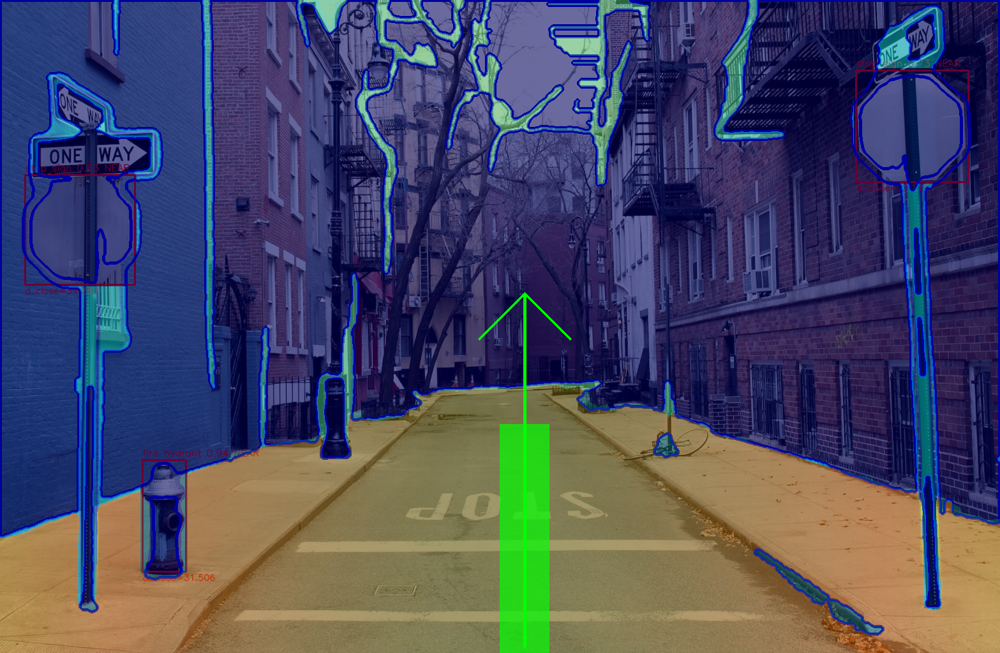

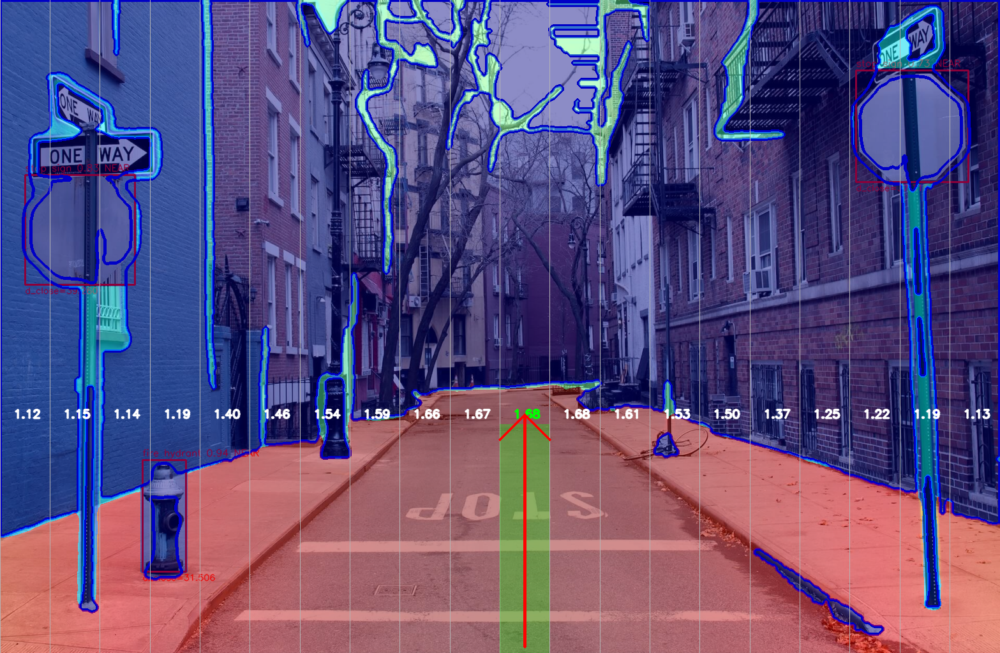

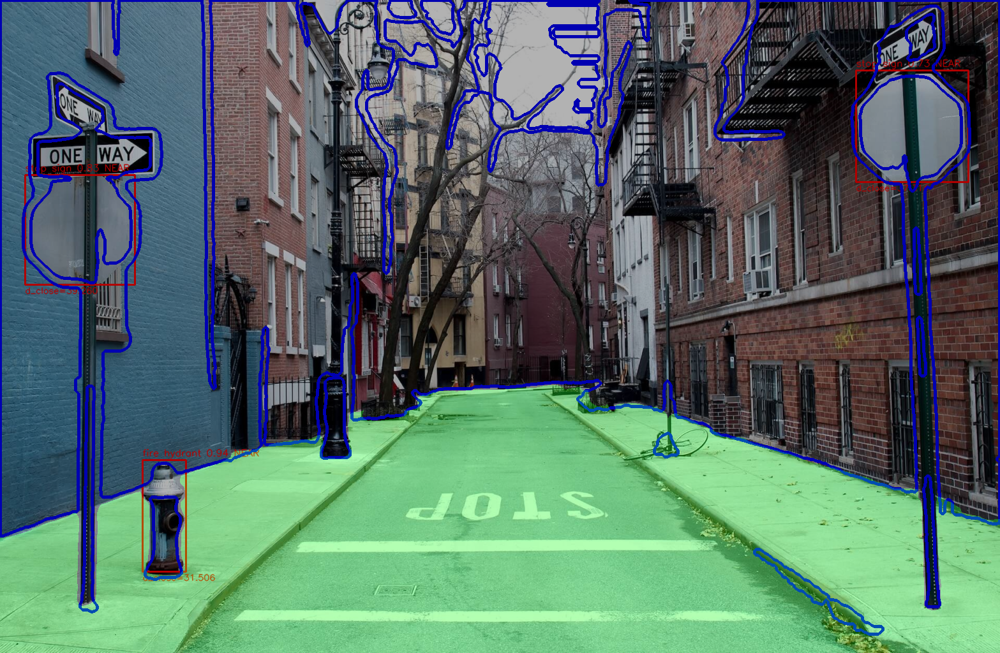

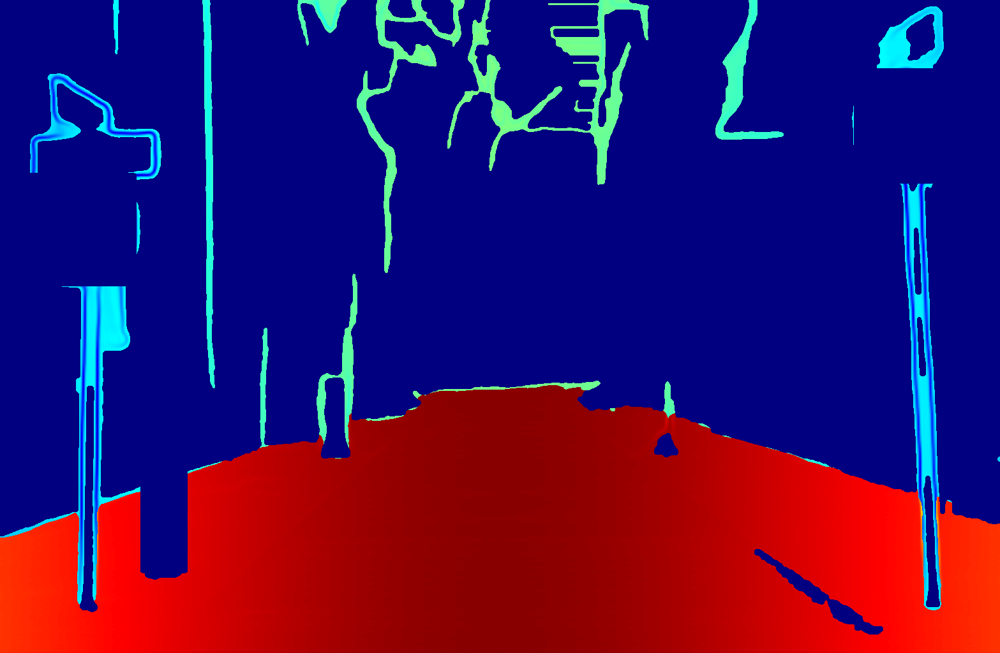

In [14]:
img_path = "./test2.jpg"
img_bgr = cv2.imread(img_path)

if img_bgr is None:
    raise ValueError(f"Cannot read image: {img_path}")

H, W = img_bgr.shape[:2]
approx_K = np.array([
    [0.9 * W, 0,       W / 2.0],
    [0,       0.9 * W, H / 2.0],
    [0,       0,       1.0]
], dtype=np.float32)

# =========================
# ① 感知流程
# =========================
combined, masks, detections, depth_pp = process_frame(
    img_bgr, K=approx_K, config={'target_h': 1024}
)

H_d, W_d = depth_pp.shape
img_resized = cv2.resize(img_bgr, (W_d, H_d), interpolation=cv2.INTER_AREA)

# =========================
# ② free-space（你原本的 hybrid_freespace_v13）
# =========================
fs_res = hybrid_freespace_v13(depth_pp, img_resized)
base_free_mask = fs_res["final_mask_img"].astype(bool)
stair_mask     = fs_res.get("stair_mask", np.zeros_like(base_free_mask, bool))

# =========================
# ③ 建 obstacle_mask = 牆 + YOLO NEAR
# =========================
yolo_mask = build_yolo_obstacle_mask(detections, H_d, W_d)

wall_mask = masks["clean_wall"]
# 確保尺寸一致
if wall_mask.shape[:2] != (H_d, W_d):
    wall_mask = cv2.resize(
        wall_mask.astype(np.uint8),
        (W_d, H_d),
        interpolation=cv2.INTER_NEAREST
    )

obstacle_mask = (wall_mask > 0) | (yolo_mask > 0)

# =========================
# ④ 給「決策」用的 free_mask（可把樓梯吃進去）
# =========================
stairs_ok = True
free_mask_for_decision = base_free_mask.copy()
if stairs_ok:
    free_mask_for_decision |= stair_mask
else:
    obstacle_mask |= stair_mask

# =========================
# ⑤ 建 Wmap
# =========================
Wmap = build_weight_map(
    free_mask=free_mask_for_decision,
    obstacle_mask=obstacle_mask,
    depth_pp=depth_pp,
    w_free=1.8,
    w_smooth=1.2,
    w_center=0.6,
    w_obs=6.0
)

# =========================
# ⑥ 決策 band 設定
# =========================
band_ratio = 0.35

# =========================
# ⑦ 扇形切區（polar 版本）
# =========================
n_sectors_polar = 20
scores_polar, best_idx_polar = score_directions_polar_from_weight_map(
    Wmap=Wmap,
    free_mask=free_mask_for_decision,
    obstacle_mask=obstacle_mask,
    band_ratio=band_ratio,
    n_sectors=n_sectors_polar,
    max_angle_deg=60.0,
    obstacle_block_thresh=0.40,
    obstacle_penalty=0.7,
)

# =========================
# ⑧ 直條切區（linear 版本）
# =========================
n_sectors_line = 20
scores_line, best_idx_line = score_directions_line_from_weight_map(
    Wmap=Wmap,
    free_mask=free_mask_for_decision,
    obstacle_mask=obstacle_mask,
    band_ratio=band_ratio,
    n_sectors=n_sectors_line,
    obstacle_block_thresh=0.40,
    obstacle_penalty=0.7,
)

# =========================
# ⑨ 比較兩種方法的「最佳分數」
# =========================
best_score_line  = scores_line[best_idx_line]   if best_idx_line  is not None else -1.0
best_score_polar = scores_polar[best_idx_polar] if best_idx_polar is not None else -1.0

use_polar = best_score_polar > best_score_line

print(f"LINEAR best={best_score_line:.2f}, POLAR best={best_score_polar:.2f}")

# =========================
# Prepare fs_on_combined for direction visualization
# (Moved from debug/visualization section)
# =========================
Hc, Wc = combined.shape[:2]

mask_to_combined = cv2.resize(
    base_free_mask.astype(np.uint8),
    (Wc, Hc),
    interpolation=cv2.INTER_NEAREST
).astype(bool)

fs_on_combined = overlay_mask(
    mask=mask_to_combined,
    img=combined.copy(),
    color=(0, 255, 0),
    alpha=0.30
)


# =========================
# ⑩ 畫「決策箭頭」圖（圖 1）
# =========================
base_for_direction = fs_on_combined.copy()   # ★ 用 combined + free-space 疊圖當底圖

if use_polar:
    direction_vis = draw_polar_arrow_on_image(
        base_img=base_for_direction,
        Wmap=Wmap,
        best_idx=best_idx_polar,
        n_sectors=n_sectors_polar,
        max_angle_deg=60.0,
        color=(0, 255, 0),
    )
else:
    direction_vis = draw_direction_with_freespace_and_weight(
        img_bgr=base_for_direction,
        Wmap=Wmap,
        free_mask=free_mask_for_decision,
        scores=scores_line,
        best_idx=best_idx_line,
        band_ratio=band_ratio,
        arrow_color=(0, 255, 0),
    )

show_img(direction_vis)

# =========================
# ⑪ 分數圖（圖 2）
# =========================
if use_polar:

    # 扇形版本：扇形線 + 分數 + 箭頭
    score_vis = draw_polar_scores_on_weight_map(
        base_img=combined,
        Wmap=Wmap,
        scores=scores_polar,
        best_idx=best_idx_polar,
        band_ratio=band_ratio,
        max_angle_deg=60.0,
    )
else:
    # 直線版本：用原本的分數圖
    score_vis = draw_scores_on_weight_map(
        base_img=combined,
        Wmap=Wmap,
        scores=scores_line,
        best_idx=best_idx_line,
        band_ratio=band_ratio
    )

show_img(score_vis)       # 圖 2

# =========================
# ⑫ 其他 debug / 視覺化 (remaining part)
# =========================

show_img(fs_on_combined)  # 圖 3：free-space 疊在 combined

# 深度圖
depth_uint8 = cv2.normalize(
    depth_pp, None, 0, 255, cv2.NORM_MINMAX
).astype(np.uint8)
#show_img(depth_uint8)     # 圖 4：深度
# 5. 權重圖（Wmap）--------------------------------
H_w, W_w = Wmap.shape
W_norm  = cv2.normalize(Wmap, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
W_color = cv2.applyColorMap(W_norm, cv2.COLORMAP_JET)

# 純權重熱度圖
show_img(W_color)         # 圖 5：Wmap 熱度圖

# 權重疊在 combined 上（方便對照場景）
combined_resized = cv2.resize(combined, (W_w, H_w))
W_overlay = cv2.addWeighted(combined_resized, 0.6, W_color, 0.4, 0)
#show_img(W_overlay)       # 圖 6：權重 + 原圖疊圖

# 影片測試

In [15]:
import cv2
import numpy as np

def read_video_frames(video_path, sample_rate=1):
    """
    讀取影片，每秒抽 sample_rate 張影像。
    回傳 (frame_index, frame_bgr)
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Cannot open video: {video_path}")

    fps = cap.get(cv2.CAP_PROP_FPS)
    # 防呆：fps 有可能回傳 0（某些影片或來源），或 sample_rate > fps
    if fps <= 0 or sample_rate <= 0:
        interval = 1
    else:
        interval = max(1, int(round(fps / sample_rate)))

    frame_id = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        if frame_id % interval == 0:
            yield frame_id, frame

        frame_id += 1

    cap.release()


class VideoSaver:
    def __init__(self, output_path, fps=1):
        self.output_path = output_path
        self.fps = fps
        self.writer = None

    def write(self, frame_bgr):
        """
        frame_bgr: numpy uint8 HxWx3 in BGR order
        """
        if frame_bgr is None:
            return
        if self.writer is None:
            h, w = frame_bgr.shape[:2]
            fourcc = cv2.VideoWriter_fourcc(*"mp4v")
            # 注意 OpenCV VideoWriter 接受 (width, height)
            self.writer = cv2.VideoWriter(self.output_path, fourcc, self.fps, (w, h))

        self.writer.write(frame_bgr)

    def close(self):
        if self.writer is not None:
            self.writer.release()
            self.writer = None


def process_one_frame(img_bgr):
    """
    修正版 FULL PIPELINE：
    - 深度(depth)
    - free-space（stair + ADE/Cityscape）
    - obstacle (wall + YOLO NEAR)
    - weight map
    - 最佳方向
    - free-space overlay + stair overlay
    - 最終 direction frame
    """
    # ============================================================
    # 0. 基本資訊
    # ============================================================
    H, W = img_bgr.shape[:2]
    approx_K = np.array([
        [0.9 * W, 0,       W / 2.0],
        [0,       0.9 * W, H / 2.0],
        [0,       0,       1.0]
    ], dtype=np.float32)


    # ============================================================
    # 1. MiDaS + segmentation + YOLO
    # ============================================================
    combined, masks, detections, depth_pp = process_frame(
        img_bgr, K=approx_K, config={'target_h': 1024}
    )

    # depth 解析度
    H_d, W_d = depth_pp.shape

    # resize 原圖到 depth 尺寸（free-space、obstacle 等都用這個尺寸）
    img_resized = cv2.resize(img_bgr, (W_d, H_d), interpolation=cv2.INTER_AREA)
    combined_resized = cv2.resize(combined, (W_d, H_d))


    # ============================================================
    # 2. Free-Space hybrid (ADE + City + Stair + Kmeans Normal)
    # ============================================================
    fs_res = hybrid_freespace_v13(depth_pp, img_resized)

    base_free_mask = fs_res["final_mask_img"].astype(bool)
    stair_mask     = fs_res.get("stair_mask", np.zeros_like(base_free_mask, bool))


    # ============================================================
    # 3. Obstacle mask（wall + YOLO）
    # ============================================================
    # YOLO mask (W_d x H_d)
    yolo_mask = build_yolo_obstacle_mask(detections, H_d, W_d).astype(bool)

    # 牆面 mask resize
    wall_mask = masks.get("clean_wall", np.zeros((H_d, W_d), dtype=np.uint8))
    if wall_mask.shape[:2] != (H_d, W_d):
        wall_mask = cv2.resize(wall_mask.astype(np.uint8),
                               (W_d, H_d),
                               interpolation=cv2.INTER_NEAREST)

    obstacle_mask = (wall_mask > 0) | yolo_mask

    # 避免 obstacle 遮住全部畫面（防爆）
    obstacle_mask = cv2.morphologyEx(obstacle_mask.astype(np.uint8),
                                     cv2.MORPH_OPEN,
                                     np.ones((3,3), np.uint8)).astype(bool)


    # ============================================================
    # 4. 組合 free-space（樓梯要納入導航）
    # ============================================================
    free_mask_for_decision = base_free_mask.copy()

    stairs_ok = True
    if stairs_ok:
        free_mask_for_decision |= stair_mask
    else:
        obstacle_mask |= stair_mask


    # ============================================================
    # 5. 建立 weight map
    # ============================================================
    Wmap = build_weight_map(
        free_mask=free_mask_for_decision,
        obstacle_mask=obstacle_mask,
        depth_pp=depth_pp,
        w_free=1.8,
        w_smooth=1.2,
        w_center=0.6,
        w_obs=6.0
    )


    # ============================================================
    # 6. 方向評分（polar + linear）
    # ============================================================
    band_ratio = 0.35

    n_sectors_polar = 20
    scores_polar, best_idx_polar = score_directions_polar_from_weight_map(
        Wmap=Wmap,
        free_mask=free_mask_for_decision,
        obstacle_mask=obstacle_mask,
        band_ratio=band_ratio,
        n_sectors=n_sectors_polar,
        max_angle_deg=60.0,
        obstacle_block_thresh=0.40,
        obstacle_penalty=0.7,
    )

    n_sectors_line = 20
    scores_line, best_idx_line = score_directions_line_from_weight_map(
        Wmap=Wmap,
        free_mask=free_mask_for_decision,
        obstacle_mask=obstacle_mask,
        band_ratio=band_ratio,
        n_sectors=n_sectors_line,
        obstacle_block_thresh=0.40,
        obstacle_penalty=0.7,
    )


    # ============================================================
    # 7. 選擇使用 LINEAR 或 POLAR
    # ============================================================
    best_score_line  = scores_line[best_idx_line]   if best_idx_line  is not None else -1.0
    best_score_polar = scores_polar[best_idx_polar] if best_idx_polar is not None else -1.0

    use_polar = best_score_polar > best_score_line


    # ============================================================
    # 8. 畫方向箭頭（direction_vis 基於 combined_resized）
    # ============================================================
    if use_polar:
        direction_vis = draw_polar_arrow_on_image(
            base_img=combined_resized,
            Wmap=Wmap,
            best_idx=best_idx_polar,
            n_sectors=n_sectors_polar,
            max_angle_deg=60.0,
            color=(0, 0, 255)
        )
    else:
        direction_vis = draw_direction_with_freespace_and_weight(
            img_bgr=combined_resized,
            Wmap=Wmap,
            free_mask=free_mask_for_decision,
            scores=scores_line,
            best_idx=best_idx_line,
            band_ratio=band_ratio,
        )

        # 若沒有有效方向 → 不要畫箭頭，避免報錯
        if best_idx_line is not None:
            arrow_target = compute_arrow_vector_from_weight(
                Wmap=Wmap,
                free_mask=free_mask_for_decision,
                best_idx=best_idx_line,
                n_sectors=n_sectors_line,
                band_ratio=band_ratio
            )

            if arrow_target is not None:
                H_vis, W_vis, _ = direction_vis.shape
                start_pt = (W_vis // 2, H_vis - 10)
                direction_vis = draw_slanted_arrow(direction_vis, start_pt, arrow_target)
        else:
            print("[SAFE MODE] No valid direction sector → skip arrow drawing")



        # ============================================================
    # 9. 最終可視化：確保箭頭 + 障礙物 在最上層
    # ============================================================

    # 先建立一個乾淨 base frame（不 overlay 任何 mask）
    final_vis = combined_resized.copy()

    # ----------- (1) 疊 free-space（亮黃色） -----------
    final_vis = overlay_mask(
        base_free_mask,
        final_vis,
        color=(0, 255, 255),   # yellow
        alpha=0.45
    )

    # ----------- (2) 疊樓梯 stair-mask（橘色） -----------
    if fs_res["has_stair"]:
        final_vis = overlay_mask(
            stair_mask,
            final_vis,
            color=(0, 200, 255),   # orange-ish yellow
            alpha=0.55
        )

    # ----------- (3) 疊障礙物 obstacle（半透明紅色） -----------
    final_vis = overlay_mask(
        obstacle_mask,
        final_vis,
        color=(0, 0, 255),   # red
        alpha=0.35
    )

    # ----------- (4) 最後畫方向箭頭（永遠最上層） -----------
    direction_layer = final_vis.copy()

    if use_polar:
        direction_layer = draw_polar_arrow_on_image(
            base_img=direction_layer,
            Wmap=Wmap,
            best_idx=best_idx_polar,
            n_sectors=n_sectors_polar,
            max_angle_deg=60.0,
            color=(0, 0, 255)
        )
    else:
        if best_idx_line is not None:
            arrow_target = compute_arrow_vector_from_weight(
                Wmap=Wmap,
                free_mask=free_mask_for_decision,
                best_idx=best_idx_line,
                n_sectors=n_sectors_line,
                band_ratio=band_ratio
            )
            if arrow_target is not None:
                start_pt = (direction_layer.shape[1]//2, direction_layer.shape[0]-10)
                direction_layer = draw_slanted_arrow(direction_layer, start_pt, arrow_target)

    # ----------- 最終結果：回傳 direction_layer（含所有資訊） -----------
    return direction_layer



In [16]:
input_video  = "./input.mp4"
output_video = "./output_direction.mp4"

video_saver = VideoSaver(output_video, fps=1)

for idx, frame in read_video_frames(input_video, sample_rate=1):

    print(f"Processing frame {idx} ...")

    result_img = process_one_frame(frame)   # 套入完整 pipeline

    video_saver.write(result_img)           # 寫入影片

video_saver.close()

print("影片輸出完成：", output_video)

Processing frame 0 ...

0: 640x384 (no detections), 117.6ms
Speed: 4.0ms preprocess, 117.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.3070
>>> No stair → using semantic segmentation (green)
Processing frame 30 ...

0: 640x384 (no detections), 9.1ms
Speed: 3.1ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.3059
>>> No stair → using semantic segmentation (green)
[SAFE MODE] No valid direction sector → skip arrow drawing
Processing frame 60 ...

0: 640x384 (no detections), 20.1ms
Speed: 7.0ms preprocess, 20.1ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.3000
>>> No stair → using semantic segmentation (green)
Processing frame 90 ...

0: 640x384 (no detections), 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.3341
>>> No 

##用Gradio即時呈現

In [17]:
import os
import cv2
import gradio as gr
import numpy as np
import tempfile
import traceback
from moviepy.editor import ImageSequenceClip

# ============================================================
# 🎬 Streaming 影片分析（支援 yield → UI 即時更新）
# ============================================================
def analyze_video_stream(video_file, sample_fps):

    try:
        video_path = video_file.name if hasattr(video_file, "name") else video_file

        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            raise ValueError("無法開啟影片")

        ori_fps = cap.get(cv2.CAP_PROP_FPS)
        if ori_fps <= 0:
            ori_fps = 30

        interval = max(1, int(round(ori_fps / sample_fps)))

        frames_out = []
        frame_idx = 0
        processed_idx = 0

        while True:
            ret, frame = cap.read()
            if not ret:
                break

            frame_idx += 1

            # 依照取樣頻率跳幀
            if frame_idx % interval != 0:
                continue

            processed_idx += 1
            print(f"[DEBUG] Processing frame {frame_idx}")

            processed = process_one_frame(frame)
            processed_rgb = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB)
            frames_out.append(processed_rgb)

            # ⭐即時顯示 frame 與狀態
            yield processed_rgb, f"處理第 {processed_idx} 張影格...", None

        cap.release()

        if len(frames_out) == 0:
            raise ValueError("影片未成功處理任何畫面")

        # ⭐全影片輸出
        out_path = tempfile.mktemp(suffix=".mp4")
        clip = ImageSequenceClip(frames_out, fps=sample_fps)
        clip.write_videofile(out_path, codec="libx264")

        yield frames_out[-1], f"分析完成！共處理 {processed_idx} 張畫面。", out_path

    except Exception as e:
        traceback.print_exc()
        yield None, f"❌ 錯誤：{str(e)}", None


# ============================================================
# 🎨 UI 版面設定
# ============================================================
custom_css = """
body {
    background: #050816;
}
.gradio-container {
    max-width: 1100px !important;
    margin: 0 auto !important;
}
#app-title {
    text-align: center;
    font-size: 26px;
    font-weight: 700;
    margin-top: 10px;
    margin-bottom: 4px;
}
#app-subtitle {
    text-align: center;
    font-size: 14px;
    opacity: 0.8;
    margin-bottom: 18px;
}
.nav-card {
    border-radius: 16px;
    padding: 12px 16px;
    background: rgba(15,23,42,0.9);
    border: 1px solid rgba(148,163,184,0.5);
    color: #e5e7eb;
    font-size: 13px;
    line-height: 1.5;
}
"""


# ============================================================
# 🚀 Demo UI v5（美觀 + Streaming）
# ============================================================
with gr.Blocks(title="MonoDepth Free-Space Navigator") as demo:

    gr.HTML(f"<style>{custom_css}</style>")

    gr.HTML("""
        <div id="app-title">智慧安全導引系統 Demo</div>
        <div id="app-subtitle">利用單眼深度 + 語意偵測實時標示可行走區域與前進方向</div>
    """)

    with gr.Row():
        # 左側
        with gr.Column(scale=1):
            gr.Markdown("### 1️⃣ 上傳影片")

            video_input = gr.Video(label="上傳錄影（直式畫面效果更佳）")

            sample_fps = gr.Slider(
                minimum=2, maximum=15, value=5, step=1,
                label="分析取樣頻率（FPS）"
            )

            start_btn = gr.Button("🚀 開始分析", variant="primary")

            with gr.Accordion("📘 系統原理（點開查看）", open=False):
                gr.Markdown("""
                - 使用 **MiDaS** 估計深度
                - 搭配 **normal-y + KMeans** 偵測樓梯踏面
                - 使用 **SegFormer** 判斷室內外 / 判斷可行走區域
                - 根據障礙物與權重地圖決定最佳前進方向
                """)

        # 右側
        with gr.Column(scale=1):
            gr.Markdown("### 2️⃣ 即時導航預覽")

            live_frame = gr.Image(label="即時處理畫面", height=420)
            status_box = gr.Textbox(label="系統狀態", lines=3)
            final_video = gr.Video(label="完成影片（可下載）")

    # ⭐ click 支援 streaming（generator）
    start_btn.click(
        fn=analyze_video_stream,
        inputs=[video_input, sample_fps],
        outputs=[live_frame, status_box, final_video]
    )

demo.launch(share=True, debug=True)


/usr/local/lib/python3.12/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
  if event.key is 'enter':



Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://8e9955bffaddaed0af.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


[DEBUG] Processing frame 10

0: 640x384 (no detections), 83.2ms
Speed: 8.1ms preprocess, 83.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.3143
>>> No stair → using semantic segmentation (green)
[DEBUG] Processing frame 20

0: 640x384 (no detections), 10.4ms
Speed: 3.9ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.2978
>>> No stair → using semantic segmentation (green)
[DEBUG] Processing frame 30

0: 640x384 (no detections), 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio=0.3035
>>> No stair → using semantic segmentation (green)
[SAFE MODE] No valid direction sector → skip arrow drawing
[DEBUG] Processing frame 40

0: 640x384 (no detections), 9.3ms
Speed: 5.9ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 384)
[SceneType] indoor, floor_ratio

Moviepy - Done !
Moviepy - video ready /tmp/tmpppd45oc1.mp4
Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://8e9955bffaddaed0af.gradio.live
